
# DSP

## Noise removal through the mean of several signals

float64
(440, 590, 4)


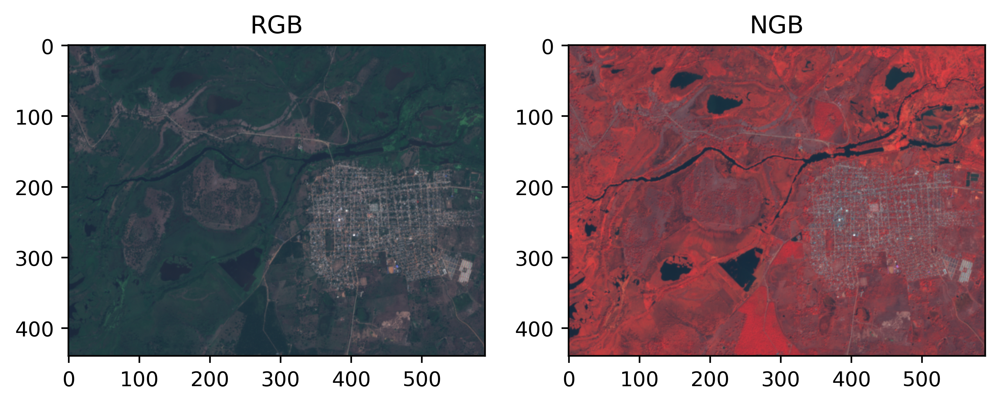

In [2]:
from matplotlib import image
from matplotlib import pyplot
#from osgeo import gdal
import numpy as np
import pandas as pd
import  scipy as sp
import scipy.io

# load image as pixel array
#dataset = gdal.Open(r'img_1.tif')

#mat = scipy.io.loadmat("remote_image_1.mat")
mat = scipy.io.loadmat("remote_image_2.mat")
dataset = np.array(mat["data"], dtype=float)


#get the bands
R = dataset[:,:,2] # Red channel
G = dataset[:,:,1] # Green channel
B = dataset[:,:,0] # Blue channel
Nir = dataset[:,:,3] # Nir channel

#Normalization
R = R/np.max(R) # Red channel
G = G/np.max(G) # Green channel
B = B/np.max(B) # Blue channel
Nir = Nir/np.max(Nir) # Nir channel

data = np.dstack((R, G, B, Nir))
RGB = np.dstack((R, G, B))
NGB = np.dstack((Nir, G, B))

#data = image.imread('img_1.tif')/255
# summarize shape of the pixel array
print(data.dtype)
print(data.shape)
# display the array of pixels as an image
fig = pyplot.figure(figsize=(8, 6), dpi=400)
ax = fig.add_subplot(1, 2, 1)
pyplot.imshow(RGB)
ax.set_title('RGB')

ax = fig.add_subplot(1, 2, 2)
pyplot.imshow(NGB)
ax.set_title('NGB')

pyplot.show()

El código anterior permite cargar una imagen,normalizarla entre 0 y 1, visualizarla y verificar el tipo de dato y las dimensiones de la imagen así: float64, (filas, columnas, número de canales de color [R,G,B, Nir])

In [2]:
def add_noise(data,mu_noise,std_noise):
    
    random_noise =np.random.normal(mu_noise,std_noise,data.shape)
    #noisy_image=data+random_noise
    noisy_image=data+random_noise
    noisy_img_clipped = np.clip(noisy_image, 0, 1)  # we might get out of bounds due to noise
    
    return noisy_img_clipped




(440, 590, 4)


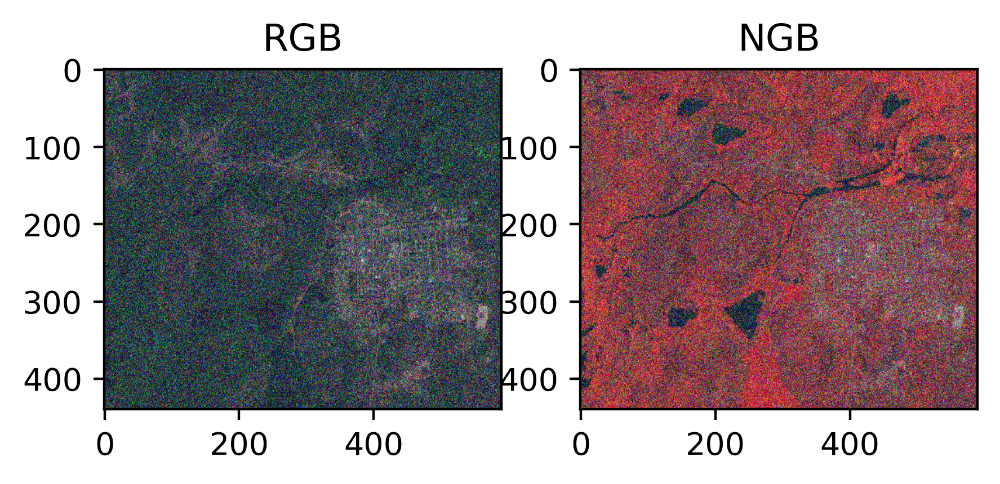

In [3]:
mu_noise=0
std_noise=0.2
noisy_image=add_noise(data,mu_noise,std_noise)
fig = pyplot.figure(figsize=(5, 2), dpi=400)
ax = fig.add_subplot(1, 2, 1)
pyplot.imshow(noisy_image[:,:,0:3], aspect='auto')
ax.set_title('RGB')

NGB_noisy =  np.dstack((noisy_image[:,:,3], noisy_image[:,:,1], noisy_image[:,:,2]))

ax = fig.add_subplot(1, 2, 2)
pyplot.imshow(NGB_noisy, aspect='auto')
ax.set_title('NGB')

print(noisy_image.shape)

pyplot.show()

AGN with parameters $\mu$= 0 y $\sigma$=0.2 

In [4]:
#EMPIECE SU CODIGO AQUI

def imagPromedio(Im, M, MuRuido,SigmaRuido):
    
    ImPromOutput = np.zeros([Im.shape[0], Im.shape[1], Im.shape[2], len(M)])
    MSE = np.zeros(len(M))
    SNR = np.zeros(len(M))
    
    for indx in range(0, len(M)):
        
        for N in range(1, M[indx] + 1):
             
            ImPromOutput[:,:,:,indx] = add_noise(Im, MuRuido, SigmaRuido) + ImPromOutput[:,:,:,indx]
            
        ImPromOutput[:,:,:,indx] = ImPromOutput[:,:,:,indx]/M[indx]
        
        aux = np.subtract(ImPromOutput[:,:,:,indx].flatten(), Im.flatten())
        MSE[indx] = np.square(np.divide(aux, Im.flatten())).mean()*100
        
        ruido = np.subtract(Im.flatten(), ImPromOutput[:,:,:,indx].flatten())
        SNR[indx] = 10*np.log10(np.square(Im.flatten()).mean())/10*np.log10(np.square(ruido).mean())
    
    return ImPromOutput, MSE, SNR

#TERMINE SU CODIGO AQUI

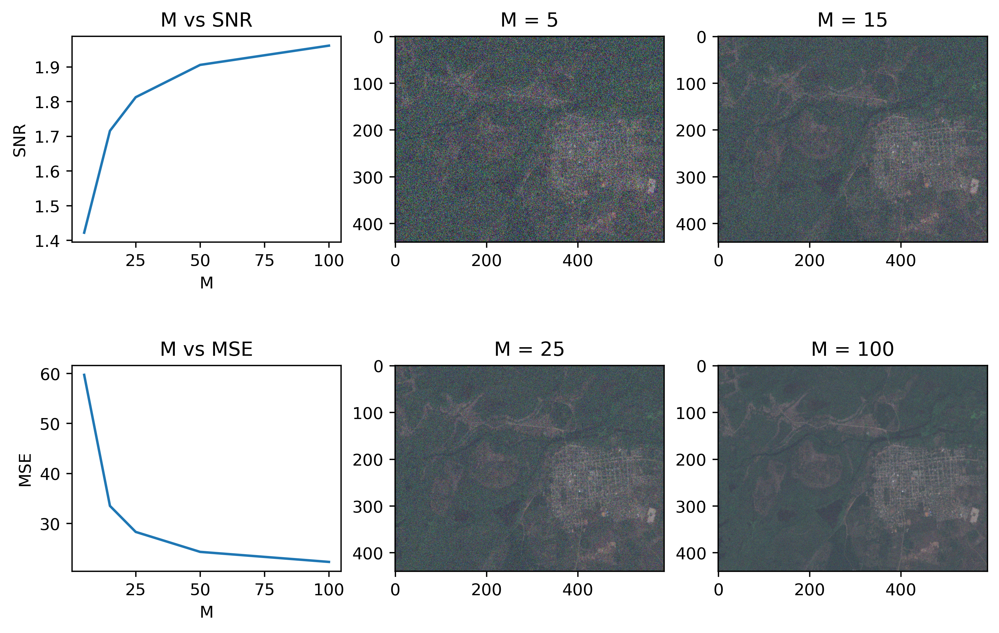

In [5]:
M = [5, 15, 25, 50, 100]
MuRuido = 0
SigmaRuido = 0.5

[ImPromOutput, MSE, SNR] = imagPromedio(data, M, MuRuido,SigmaRuido)


# display the array of pixels as an image
fig, ax = pyplot.subplots(2, 3, figsize=(10, 6), dpi=400)

ax[0,0].plot(M, SNR)
ax[0,0].set_title('M vs SNR')
ax[0,0].set(xlabel='M', ylabel='SNR')

ax[0,1].imshow(ImPromOutput[:,:,0:3,0], aspect='auto')
ax[0,1].set_title('M = 5')

ax[0,2].imshow(ImPromOutput[:,:,0:3,1], aspect='auto')
ax[0,2].set_title('M = 15')

ax[1,0].plot(M, MSE)
ax[1,0].set_title('M vs MSE')
ax[1,0].set(xlabel='M', ylabel='MSE')

ax[1,1].imshow(ImPromOutput[:,:,0:3,2], aspect='auto')
ax[1,1].set_title('M = 25')

ax[1,2].imshow(ImPromOutput[:,:,0:3,4], aspect='auto')
ax[1,2].set_title('M = 100')

fig.subplots_adjust(hspace = 0.6)

pyplot.show()

## Correlación de señales

Implemente la rutina correlacion descrita en el punto 5.2 de la guía del Laboratorio 1

In [5]:
def correlacion(x,y,rang):
    
    y_shift_right=np.zeros((len(y)))
    y_shift_left=np.zeros((len(y)))
    r0=0
    print(type(r0))
    
    r_right=np.zeros(rang)
    r_left=np.zeros(rang)
    r= np.zeros(2*rang-1)
    r_norm=np.zeros(2*rang-1)
    
    for l in range(rang):
        
    #EMPIECE SU CODIGO AQUI    
        y_shift_right[l:len(y_shift_right)]=y[0:len(y)-l]
        y_shift_left[0:len(y_shift_left)-l]=y[l:len(y)]
        
        x_long=np.pad(x, (0, abs(len(x)-len(y_shift_right))), 'constant')
        
        r_right[l]= np.dot(x_long,y_shift_right)
        r_left[l]= np.dot(x_long,y_shift_left)
        
        if l==0:
            v0=r_right[0]
        
    r_left=np.flip(r_left)
    r_left=np.delete(r_left,len(r_left)-1)
    r=np.concatenate((r_left,r_right))
    r0=np.where(r==v0)
    r_norm=np.divide(r,(np.sqrt(np.dot(x,x)*np.dot(y,y))))
    
    pyplot.subplot(121)
    pyplot.stem(np.arange(-rang,rang-1),r)
    pyplot.xlabel('$l$')
    pyplot.ylabel('$r_{xy}$')
    pyplot.subplot(122)
    
    pyplot.stem(np.arange(-rang,rang-1),r_norm)
    pyplot.xlabel('$l$')
    pyplot.ylabel('$rnorm_{xy}$')
    pyplot.show
    #TERMINE SU CODIGO AQUI
    return r,r_norm,r0

<class 'int'>
Vector de correlación r[l]: [  0.   0.  10.  -9.  19.  36. -14.  33.   0.   7.  13. -18.  16.  -7.
   5.  -3.   0.   0.   0.]
Vector de correlación normalizada r_norm[l]: [ 0.          0.          0.15228623 -0.1370576   0.28934383  0.54823041
 -0.21320072  0.50254455  0.          0.10660036  0.19797209 -0.27411521
  0.24365796 -0.10660036  0.07614311 -0.04568587  0.          0.
  0.        ]
Posición en el vector de correlación  r[l] de r[0]: [10]


/Users/hernan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
/Users/hernan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


tuple

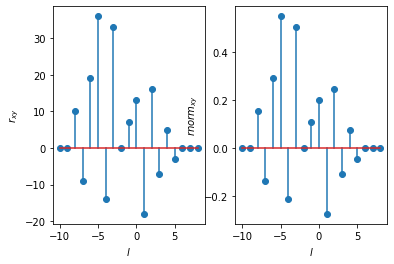

In [6]:
x=np.array([0,0,2,-1,3,7,1,2,-3,0,0])
y=np.array([0,0,1,-1,2,-2,4,1,-2,5,0,0])

#ro=np.dot(x,y)
#print(ro)
rang=10
[r,r_norm,r0]=correlacion(x,y,rang)
print("Vector de correlación r[l]:",r)
print('Vector de correlación normalizada r_norm[l]:',r_norm)
print("Posición en el vector de correlación  r[l] de r[0]:",r0[0]+1)
type(r0)

In [10]:
x1=np.array([2,0,1,2,-3])
y1=np.array([2,0,1,2,3])
r1=np.dot(x1,y1)
print("Valor correlación en r[l], l=0:",r1)


Valor correlación en r[l], l=0: 0


**Salidas esperadas de la rutina de correlación**:

<table>
    <tr>
        <td>
            **r[l]**
        </td>
        <td>
           [ -9.  19.  36. -14.  33.   0.   7.  13. -18.  16.  -7.   5.  -3.]
        </td>
    </tr>
     <tr>
        <td>
            **rnorm[l]**
        </td>
        <td>
          [-0.1370576   0.28934383  0.54823041 -0.21320072  0.50254455  0.
  0.10660036  0.197]
        </td>
    </tr>
    <tr>
        <td>
            **r0**
        </td>
        <td>
         7
        </td>
    </tr>

</table>

### Cálculo del periodo de una señal por autocorrelación

De acuerdo con las instrucciones del punto 5.3.b en la guía del Laboratorio 1 descargue el archivo cana1.xls que contiene 9 variables y ábralo usando las siguientes instrucciones.  

In [74]:
df=pd.read_excel('cana1.xlsx')

Copie la columna precipitacion en la variable prep y transformela a una arreglo numpy:

In [76]:
prep=df["precipitaci—n"]
prep=prep.to_numpy() #convert prep into a numpy array

In [87]:
prep_norm1=np.divide(prep-np.mean(prep),np.std(prep))
prep_norm2=np.divide(prep-np.min(prep),np.max(prep))

/Users/hernan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
/Users/hernan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


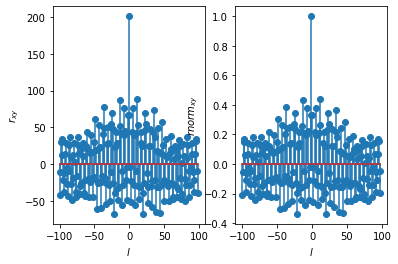

In [88]:
[r,r_norm,r0]=correlacion(prep_norm1,prep_norm1,round(len(prep)/2))



/Users/hernan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
/Users/hernan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


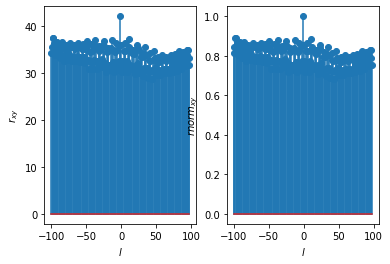

In [89]:
[r,r_norm,r0]=correlacion(prep_norm2,prep_norm2,round(len(prep)/2))

In [3]:
x1=np.array([2,0,1,2,-3])
y1=np.array([2,0,1,2,3])

In [4]:
np.dot(x1,y1)

0